In [1]:
import os
from os import listdir
import pandas as pd
import numpy as np
import glob
import tqdm
from typing import Dict
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set(style="whitegrid")
import cv2
from colorama import Fore, Back, Style
!pip install chart_studio
import plotly.express as px
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
import warnings
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
plt.show()

     |████████████████████████████████| 64 kB 436 kB/s            


/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning:

The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.0-CAPI-1.16.0). Conversions between both will be slow.



In [2]:
list(os.listdir("../input/handwriting-recognition"))

['test_v2',
 'written_name_test_v2.csv',
 'validation_v2',
 'written_name_train_v2.csv',
 'train_v2',
 'written_name_validation_v2.csv']

In [3]:
IMAGE_PATH = "../input/handwriting-recognition"

train_df = pd.read_csv('../input/handwriting-recognition/written_name_train_v2.csv')
val_df = pd.read_csv('../input/handwriting-recognition/written_name_validation_v2.csv')
test_df = pd.read_csv('../input/handwriting-recognition/written_name_test_v2.csv')

print(Fore.YELLOW + 'Training data shape: ',Style.RESET_ALL,train_df.shape)
print(Fore.YELLOW + 'Validation data shape: ',Style.RESET_ALL,val_df.shape)
train_df.head(5)

Training data shape:   (330961, 2)
Validation data shape:   (41370, 2)


,FILENAME,IDENTITY
0,TRAIN_00001.jpg,BALTHAZAR
1,TRAIN_00002.jpg,SIMON
2,TRAIN_00003.jpg,BENES
3,TRAIN_00004.jpg,LA LOVE
4,TRAIN_00005.jpg,DAPHNE


In [4]:
train_df.groupby(['IDENTITY']).count()['FILENAME'].to_frame()

,FILENAME
IDENTITY,
'A'OPES,1
'LE BASTARD,1
-,8
--,2
-------,2
...,...
pascal,1
poterlot,1
tabare,1


In [5]:
print(Fore.YELLOW + 'Train Set !!',Style.RESET_ALL)
print(train_df.info())
print('-------------')
print(Fore.YELLOW + 'Validation Set !!',Style.RESET_ALL)
print(val_df.info())
print('-------------')
print(Fore.BLUE + 'Test Set !!',Style.RESET_ALL)
print(test_df.info())

Train Set !! 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 330961 entries, 0 to 330960
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   FILENAME  330961 non-null  object
 1   IDENTITY  330396 non-null  object
dtypes: object(2)
memory usage: 5.1+ MB
None
-------------
Validation Set !! 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41370 entries, 0 to 41369
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   FILENAME  41370 non-null  object
 1   IDENTITY  41292 non-null  object
dtypes: object(2)
memory usage: 646.5+ KB
None
-------------
Test Set !! 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41370 entries, 0 to 41369
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   FILENAME  41370 non-null  object
 1   IDENTITY  41300 non-null  object
dtypes: object(2)
memory usage: 646.5+ KB
None


In [6]:
train_df.isna().sum()

FILENAME      0
IDENTITY    565
dtype: int64

In [7]:
val_df.isna().sum()

FILENAME     0
IDENTITY    78
dtype: int64

In [8]:
test_df.isna().sum()

FILENAME     0
IDENTITY    70
dtype: int64

In [9]:
columns = train_df.keys()
columns = list(columns)
print(columns)

['FILENAME', 'IDENTITY']


In [10]:
train_df['IDENTITY'].value_counts()

THOMAS           1825
EMPTY            1796
LEA              1582
EMMA             1482
LUCAS            1479
                 ... 
DE METZ             1
SCHOPPMANN          1
SCHNITZLER          1
HELYIL              1
COUTINHO DESA       1
Name: IDENTITY, Length: 100539, dtype: int64

In [11]:
train_df['IDENTITY'].iplot(kind='hist',xTitle='NAME',linecolor='black',opacity=0.8,color='#FB8072',bargap=0.5,gridcolor='white',title='Distibution of names in training set')

Image size.......:   64 x 284, 4968 bytes


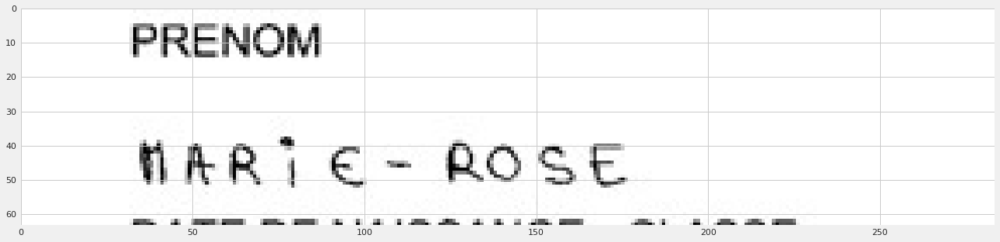

In [12]:
def show_image(image,file):
    file_size = os.path.getsize(file)
    print(Fore.BLUE + "Image size.......:",Style.RESET_ALL," {rows:d} x {cols:d}, {size:d} bytes".format(
            rows=image.shape[0], cols=image.shape[1], size=file_size))
    plt.figure(figsize=(20, 40))
    plt.imshow(image, cmap='gray')
    plt.show()
for file_path in glob.glob('../input/handwriting-recognition/train_v2/train/*.jpg'):
    image = cv2.imread(file_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    show_image(image,file_path)
    break 

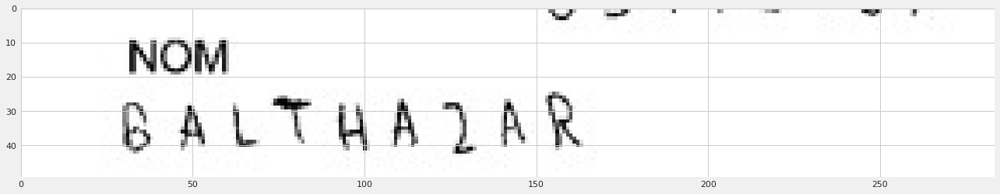

In [13]:
image = cv2.imread('../input/handwriting-recognition/train_v2/train/TRAIN_00001.jpg')
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 40))
plt.imshow(image, cmap='jet')

In [14]:
import pandas_profiling as pdp

In [15]:
profile_train_df = pdp.ProfileReport(train_df)

In [16]:
profile_train_df

Summarize dataset:   0%|          | 0/15 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
profile_test_df = pdp.ProfileReport(test_df)
profile_val_df = pdp.ProfileReport(val_df)

In [18]:
profile_test_df

Summarize dataset:   0%|          | 0/15 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
profile_val_df

Summarize dataset:   0%|          | 0/15 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]